# Подключение зависимостей

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import ccxt
from IPython.display import clear_output, display
import dill

#sns.set_theme()
%matplotlib inline

In [3]:
import mlflow
from mlflow.tracking import MlflowClient
import mlflavors
import mlforecast.flavor

from statsforecast import StatsForecast
from statsforecast.models import ARCH, GARCH
from mlforecast import MLForecast
from mlforecast.utils import PredictionIntervals
from datasetsforecast import losses
from utilsforecast.plotting import plot_series

from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import lightgbm as lgb

In [4]:
from neuralforecast import NeuralForecast
from neuralforecast.models import NLinear, DLinear, KAN, NBEATS, NHITS, TFT, LSTM
from neuralforecast.losses.pytorch import MAE, RMSE, HuberLoss, MQLoss

import optuna

# Подключение к MLFlow

In [5]:
mlflow.set_tracking_uri("http://mlflow:5000")

In [6]:
mlflow.set_experiment("btc-usdt_volatility_research")

<Experiment: artifact_location='mlflow-artifacts:/3', creation_time=1727609518788, experiment_id='3', last_update_time=1727609518788, lifecycle_stage='active', name='btc-usdt_volatility_research', tags={}>

# Проведение экспериментов 

## Подготовка данных

In [7]:
# Биржа из которой будут браться данные с помощью CCXT
EXCHANGE = ccxt.okx()
# Инструмент в формате символа для обработки
SYMBOL = "BTC/USDT"
# Таймфрейм свеч
TIMEFRAME = "1h"

In [8]:
from_ts = EXCHANGE.parse8601('2023-01-01 00:00:00')

ohlcv_list = []
ohlcv = EXCHANGE.fetch_ohlcv(symbol=SYMBOL, timeframe=TIMEFRAME, since=from_ts, limit=100)
ohlcv_list.append(ohlcv)

while True:
    from_ts = ohlcv[-1][0]
    new_ohlcv = EXCHANGE.fetch_ohlcv(symbol=SYMBOL, timeframe=TIMEFRAME, since=from_ts, limit=100)
    ohlcv.extend(new_ohlcv)

    print(f"\r{EXCHANGE.iso8601(from_ts)}", end="")
    
    if len(new_ohlcv) <= 1:
    	break

2024-09-30T10:00:00.000Z

In [9]:
ohlcv = pd.DataFrame(ohlcv, columns=["date", "open", "high", "low", "close", "volume"])
ohlcv["date"] = ohlcv["date"].apply(lambda x: datetime.datetime.fromtimestamp(x / 1000))
ohlcv["close_pct_change"] = ohlcv["close"].pct_change() * 100
ohlcv['close_pct_change'] = ohlcv['close_pct_change'].fillna(0)
ohlcv.reset_index(drop=True)

,date,open,high,low,close,volume,close_pct_change
0,2023-01-01 00:00:00,16546.1,16548.1,16512.7,16535.0,50.607670,0.000000
1,2023-01-01 01:00:00,16535.0,16558.2,16532.6,16556.9,31.363875,0.132446
2,2023-01-01 02:00:00,16556.9,16562.8,16544.5,16551.4,211.375181,-0.033219
3,2023-01-01 03:00:00,16551.5,16551.5,16523.9,16538.5,67.468389,-0.077939
4,2023-01-01 04:00:00,16538.6,16538.7,16517.0,16523.2,48.306215,-0.092511
...,...,...,...,...,...,...,...
15473,2024-09-30 07:00:00,64342.1,64686.0,64340.0,64563.9,299.412763,0.344876
15474,2024-09-30 08:00:00,64564.0,64580.0,64033.0,64309.5,565.487060,-0.394028
15475,2024-09-30 09:00:00,64309.5,64309.5,63542.0,63542.0,732.258783,-1.193447
15476,2024-09-30 10:00:00,63541.9,63671.8,63250.0,63565.8,818.222353,0.037456


In [10]:
ohlcv

,date,open,high,low,close,volume,close_pct_change
0,2023-01-01 00:00:00,16546.1,16548.1,16512.7,16535.0,50.607670,0.000000
1,2023-01-01 01:00:00,16535.0,16558.2,16532.6,16556.9,31.363875,0.132446
2,2023-01-01 02:00:00,16556.9,16562.8,16544.5,16551.4,211.375181,-0.033219
3,2023-01-01 03:00:00,16551.5,16551.5,16523.9,16538.5,67.468389,-0.077939
4,2023-01-01 04:00:00,16538.6,16538.7,16517.0,16523.2,48.306215,-0.092511
...,...,...,...,...,...,...,...
15473,2024-09-30 07:00:00,64342.1,64686.0,64340.0,64563.9,299.412763,0.344876
15474,2024-09-30 08:00:00,64564.0,64580.0,64033.0,64309.5,565.487060,-0.394028
15475,2024-09-30 09:00:00,64309.5,64309.5,63542.0,63542.0,732.258783,-1.193447
15476,2024-09-30 10:00:00,63541.9,63671.8,63250.0,63565.8,818.222353,0.037456


In [11]:
ohlcv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15478 entries, 0 to 15477
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              15478 non-null  datetime64[ns]
 1   open              15478 non-null  float64       
 2   high              15478 non-null  float64       
 3   low               15478 non-null  float64       
 4   close             15478 non-null  float64       
 5   volume            15478 non-null  float64       
 6   close_pct_change  15478 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 846.6 KB


In [12]:
ohlcv.shape

(15478, 7)

In [13]:
ohlcv.nunique()

date                15323
open                14760
high                14499
low                 14461
close               14752
volume              15324
close_pct_change    15314
dtype: int64

In [14]:
ohlcv["date"].astype(int)

0        1672531200000000000
1        1672534800000000000
2        1672538400000000000
3        1672542000000000000
4        1672545600000000000
                ...         
15473    1727679600000000000
15474    1727683200000000000
15475    1727686800000000000
15476    1727690400000000000
15477    1727690400000000000
Name: date, Length: 15478, dtype: int64

В данных могут появится дубликаты, от них надо избавлятся

In [15]:
ohlcv = ohlcv.drop_duplicates(subset=['date'], keep='last')

In [16]:
ohlcv

,date,open,high,low,close,volume,close_pct_change
0,2023-01-01 00:00:00,16546.1,16548.1,16512.7,16535.0,50.607670,0.000000
1,2023-01-01 01:00:00,16535.0,16558.2,16532.6,16556.9,31.363875,0.132446
2,2023-01-01 02:00:00,16556.9,16562.8,16544.5,16551.4,211.375181,-0.033219
3,2023-01-01 03:00:00,16551.5,16551.5,16523.9,16538.5,67.468389,-0.077939
4,2023-01-01 04:00:00,16538.6,16538.7,16517.0,16523.2,48.306215,-0.092511
...,...,...,...,...,...,...,...
15472,2024-09-30 06:00:00,64525.8,64712.0,64342.0,64342.0,394.771765,-0.284847
15473,2024-09-30 07:00:00,64342.1,64686.0,64340.0,64563.9,299.412763,0.344876
15474,2024-09-30 08:00:00,64564.0,64580.0,64033.0,64309.5,565.487060,-0.394028
15475,2024-09-30 09:00:00,64309.5,64309.5,63542.0,63542.0,732.258783,-1.193447


In [17]:
train_df = pd.DataFrame(
    columns = ["ds", "y", "unique_id"]   
)

train_df["ds"] = ohlcv["date"].iloc[-15024:-300]
train_df["y"] = ohlcv["close_pct_change"].iloc[-15024:-300]
train_df["unique_id"] = 1
train_df = train_df.reset_index(drop=True)

In [18]:
train_df

,ds,y,unique_id
0,2023-01-13 11:00:00,-0.640083,1
1,2023-01-13 12:00:00,-0.325010,1
2,2023-01-13 13:00:00,-0.036583,1
3,2023-01-13 14:00:00,0.747318,1
4,2023-01-13 15:00:00,1.396157,1
...,...,...,...
14719,2024-09-17 18:00:00,-0.679031,1
14720,2024-09-17 19:00:00,-0.939370,1
14721,2024-09-17 20:00:00,0.242113,1
14722,2024-09-17 21:00:00,0.357303,1


In [19]:
test_df = pd.DataFrame(
    columns = ["ds", "y", "unique_id"]   
)

test_df["ds"] = ohlcv["date"].iloc[-300:]
test_df["y"] = ohlcv["close_pct_change"].iloc[-300:]
test_df["unique_id"] = 1
test_df = test_df.reset_index(drop=True)

In [20]:
test_df

,ds,y,unique_id
0,2024-09-17 23:00:00,0.124503,1
1,2024-09-18 00:00:00,-0.133633,1
2,2024-09-18 01:00:00,-0.202543,1
3,2024-09-18 02:00:00,0.405077,1
4,2024-09-18 03:00:00,0.269072,1
...,...,...,...
295,2024-09-30 06:00:00,-0.284847,1
296,2024-09-30 07:00:00,0.344876,1
297,2024-09-30 08:00:00,-0.394028,1
298,2024-09-30 09:00:00,-1.193447,1


# Кросс валидация

In [60]:
models = [
    NLinear(h=48, input_size=300, loss=HuberLoss(delta=0.33), random_seed=1),
    DLinear(h=48, input_size=300, loss=HuberLoss(delta=0.33), random_seed=1),
    KAN(h=48, input_size=300, loss=HuberLoss(delta=0.33), random_seed=1),
    NBEATS(h=48, input_size=300, loss=HuberLoss(delta=0.33), random_seed=1),
    NHITS(h=48, input_size=300, loss=HuberLoss(delta=0.33), random_seed=1),
    LSTM(h=48, input_size=300, loss=HuberLoss(delta=0.33), random_seed=1),
]

Seed set to 1
Seed set to 1
Seed set to 1
Seed set to 1
Seed set to 1
Seed set to 1


In [61]:
nf = NeuralForecast(models=models, freq='h')

In [62]:
crossvalidation_df = nf.cross_validation(df=train_df,
                                         step_size=1,
                                         n_windows=30)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | HuberLoss     | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | linear       | Linear        | 14.4 K | train
-------------------------------------------------------
14.4 K    Trainable params
0         Non-trainable params
14.4 K    Total params
0.058     Total estimated model params size (MB)
4         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=5000` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | HuberLoss     | 0      | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | linear_trend  | Linear        | 14.4 K | train
5 | linear_season | Linear        | 14.4 K | train
--------------------------------------------------------
28.9 K    Trainable params
0         Non-trainable params
28.9 K    Total params
0.116     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=5000` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | HuberLoss     | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 1.8 M  | train
-------------------------------------------------------
1.8 M     Trainable params
0         Non-trainable params
1.8 M     Total params
7.127     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=1000` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | HuberLoss     | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 3.1 M  | train
-------------------------------------------------------
3.1 M     Trainable params
33.8 K    Non-trainable params
3.1 M     Total params
12.552    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=1000` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | HuberLoss     | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 3.2 M  | train
-------------------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.710    Total estimated model params size (MB)
34        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=1000` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | HuberLoss     | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 484 K  | train
4 | context_adapter | Linear        | 96.5 K | train
5 | mlp_decoder     | MLP           | 2.4 K  | train
----------------------------------------------------------
582 K     Trainable params
0         Non-trainable params
582 K     Total params
2.332     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=1000` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


In [63]:
crossvalidation_df

,ds,cutoff,NLinear,DLinear,KAN,NBEATS,NHITS,LSTM,y
unique_id,,,,,,,,,
1,2024-09-25 12:00:00,2024-09-25 11:00:00,0.000370,0.000209,0.001212,0.000102,-0.000109,-0.000598,-0.003789
1,2024-09-25 13:00:00,2024-09-25 11:00:00,0.001211,0.001101,0.000349,0.000003,-0.000149,-0.000474,0.002547
1,2024-09-25 14:00:00,2024-09-25 11:00:00,0.000641,0.000669,-0.000046,0.000541,-0.000049,-0.000634,0.002823
1,2024-09-25 15:00:00,2024-09-25 11:00:00,-0.000754,-0.000987,-0.001354,0.000099,-0.000088,-0.000390,-0.006866
1,2024-09-25 16:00:00,2024-09-25 11:00:00,0.000030,-0.000140,-0.000262,-0.000278,0.000063,-0.000292,-0.000584
...,...,...,...,...,...,...,...,...,...
1,2024-09-28 12:00:00,2024-09-26 16:00:00,-0.000118,-0.000564,-0.000744,0.000091,-0.000300,0.000271,-0.003809
1,2024-09-28 13:00:00,2024-09-26 16:00:00,0.000557,0.000393,-0.000492,-0.000241,0.000025,0.000006,-0.000201
1,2024-09-28 14:00:00,2024-09-26 16:00:00,0.000159,0.000090,-0.000067,-0.000219,0.000206,-0.000849,0.002878


In [64]:
crossvalidation_df.columns

Index(['ds', 'cutoff', 'NLinear', 'DLinear', 'KAN', 'NBEATS', 'NHITS', 'LSTM',
       'y'],
      dtype='object')

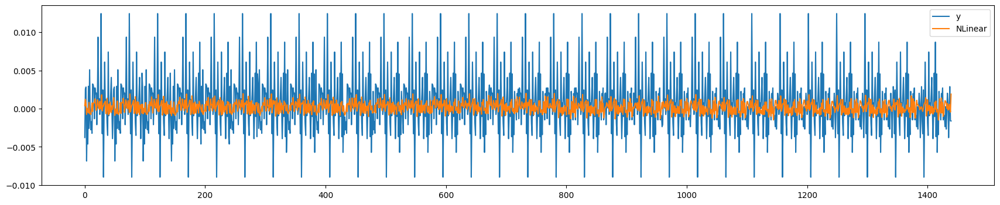

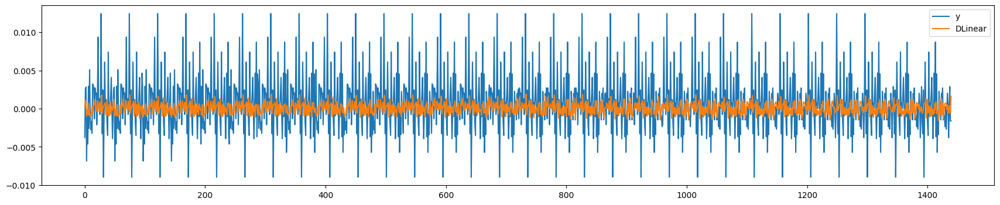

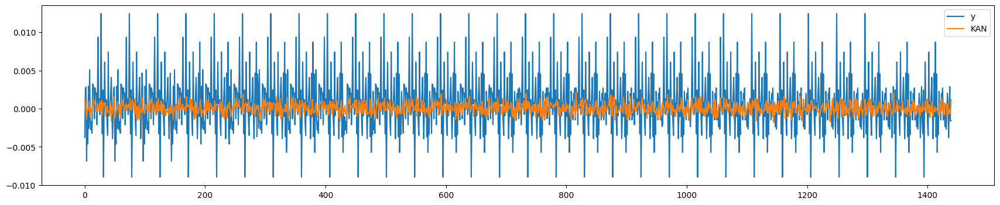

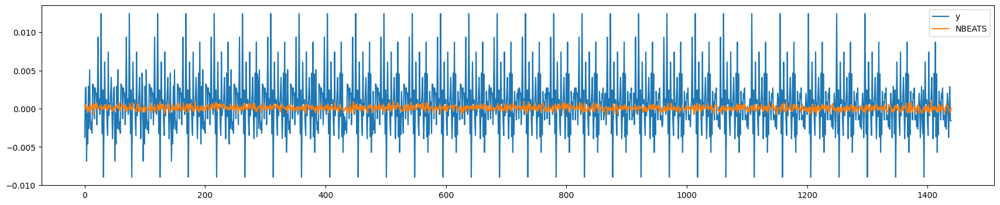

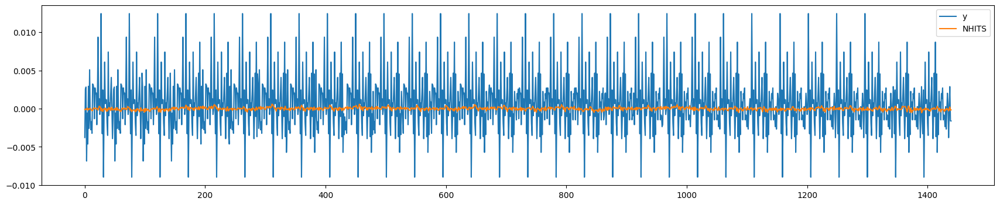

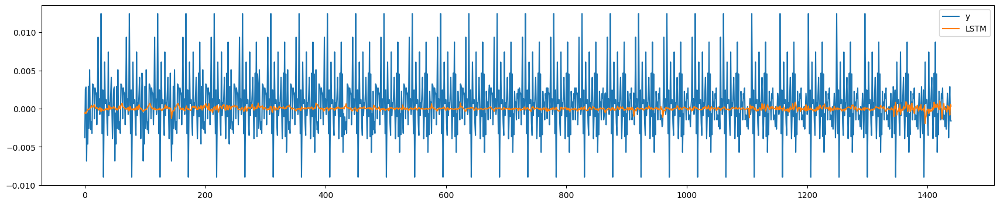

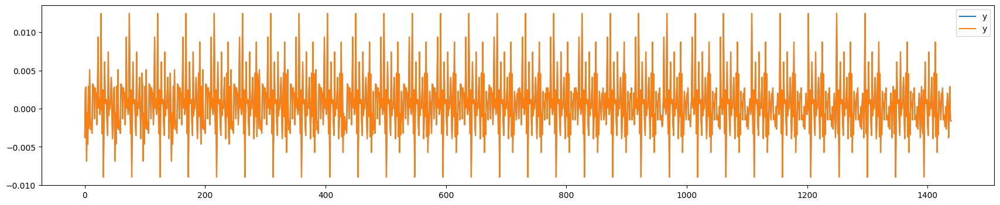

In [65]:
for i in crossvalidation_df.columns[2:]:
    crossvalidation_df.reset_index()[["y", i]].plot(figsize=(21, 4))
    plt.show()

# Оптимизация гиперпараметров

In [21]:
train_df_15k = pd.DataFrame(
    columns = ["ds", "y", "unique_id"]   
)

train_df_15k["ds"] = ohlcv["date"].iloc[-15048:-48]
train_df_15k["y"] = ohlcv["close_pct_change"].iloc[-15048:-48]
train_df_15k["unique_id"] = 1
train_df_15k = train_df_15k.reset_index(drop=True)

In [22]:
train_df_15k.shape

(15000, 3)

In [23]:
train_df_5k = pd.DataFrame(
    columns = ["ds", "y", "unique_id"]   
)

train_df_5k["ds"] = ohlcv["date"].iloc[-5048:-48]
train_df_5k["y"] = ohlcv["close_pct_change"].iloc[-5048:-48]
train_df_5k["unique_id"] = 1
train_df_5k = train_df_5k.reset_index(drop=True)

In [24]:
train_df_5k.shape

(5000, 3)

In [25]:
train_df_1k = pd.DataFrame(
    columns = ["ds", "y", "unique_id"]   
)

train_df_1k["ds"] = ohlcv["date"].iloc[-1048:-48]
train_df_1k["y"] = ohlcv["close_pct_change"].iloc[-1048:-48]
train_df_1k["unique_id"] = 1
train_df_1k = train_df_1k.reset_index(drop=True)

In [26]:
train_df_1k.shape

(1000, 3)

In [27]:
test_df = pd.DataFrame(
    columns = ["ds", "y", "unique_id"]   
)

test_df["ds"] = ohlcv["date"].iloc[-48:]
test_df["y"] = ohlcv["close_pct_change"].iloc[-48:]
test_df["unique_id"] = 1
test_df = test_df.reset_index(drop=True)

In [28]:
test_df.shape

(48, 3)

In [29]:
test_df.head()

,ds,y,unique_id
0,2024-09-28 11:00:00,0.058393,1
1,2024-09-28 12:00:00,-0.380852,1
2,2024-09-28 13:00:00,-0.020138,1
3,2024-09-28 14:00:00,0.287780,1
4,2024-09-28 15:00:00,-0.160822,1


In [30]:
def objective_15k(trial):
    try:
        model = trial.suggest_categorical(
            "model", 
            [
                "NLinear", 
                "DLinear",
                "KAN",
                "NBEATS",
                "NHITS",
                "LSTM",
            ]
        )
        
        if model == "NLinear":
            input_size = trial.suggest_int("input_size_nl", 100, 500)
            max_steps = trial.suggest_int("max_steps_nl", 1000, 5000)
            batch_size = trial.suggest_int("batch_size_nl", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nl", 0.001, 1)
            models = [NLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
            
        if model == "DLinear":
            input_size = trial.suggest_int("input_size_dl", 100, 500)
            max_steps = trial.suggest_int("max_steps_dl", 1000, 5000)
            batch_size = trial.suggest_int("batch_size_dl", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_dl", 0.001, 1)
            models = [DLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "KAN":
            input_size = trial.suggest_int("input_size_kan", 100, 500)
            max_steps = trial.suggest_int("max_steps_kan", 100, 1000)
            batch_size = trial.suggest_int("batch_size_kan", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_kan", 0.001, 1)
            models = [KAN(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "NBEATS":
            input_size = trial.suggest_int("input_size_nb", 100, 500)
            max_steps = trial.suggest_int("max_steps_nb", 100, 1000)
            batch_size = trial.suggest_int("batch_size_nb", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nb", 0.001, 1)
            models = [NBEATS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "NHITS":
            input_size = trial.suggest_int("input_size_nh", 100, 500)
            max_steps = trial.suggest_int("max_steps_nh", 100, 1000)
            batch_size = trial.suggest_int("batch_size_nh", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nh", 0.001, 1)
            models = [NHITS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "LSTM":
            input_size = trial.suggest_int("input_size_lstm", 100, 500)
            max_steps = trial.suggest_int("max_steps_lstm", 100, 1000)
            batch_size = trial.suggest_int("batch_size_lstm", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_lstm", 0.001, 1)
            models = [LSTM(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
            
        
        run_name = f'{model}_data_15k_{str(datetime.datetime.now())}'
        with mlflow.start_run(run_name=run_name) as run:
            # Лучшие параметры полученные в исследовании
            params = {
                "h": 48,
                "loss": "MQLoss(level=[99, 95, 90, 75, 50])",
                "random_seed": 1,
                "input_size": input_size, 
                "max_steps": max_steps, 
                "batch_size": batch_size, 
                "learning_rate": learning_rate, 
            }
            # Сохранение тегов
            mlflow.set_tag("model_name", model)
            mlflow.set_tag("model_type", "regression")
            # Сохранение параметров
            mlflow.log_params(params)
            
            nf = NeuralForecast(models=models, freq='h')
            nf.fit(train_df_15k)

            # Прогнозирование для test датасета
            forecasts = nf.predict()
            forecasts = forecasts.reset_index()
            current_columns = forecasts.columns.tolist()
            current_columns[2] = current_columns[2].split("-")[0]
            forecasts.columns = current_columns
    
            # Рассчёт метрик
            _rmse = losses.rmse(test_df["y"].values, forecasts.iloc[:, 2].values)
            rmse = losses.rmse(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            mse = losses.mse(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            mae = losses.mae(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            smape = losses.smape(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
    
            # Сохранение метрик
            mlflow.log_metric("RMSE", rmse)
            mlflow.log_metric("MSE", mse)
            mlflow.log_metric("MAE", mae)
            mlflow.log_metric("SMAPE", smape)
    
            # Сохранение визуализации
            fig = plot_series(
                pd.concat([train_df_15k.iloc[-300:], test_df[:24]]), 
                forecasts_df=forecasts,
                engine='matplotlib',
                level=[99, 95, 90, 75, 50],
            )
            fig.savefig('forecast.png', bbox_inches='tight')
            plt.close()
            mlflow.log_artifact("forecast.png", "forecast")

            return _rmse
        
    except Exception as e:
        print("ОШИБКА: ", e)
        return 1000000000

In [31]:
def objective_5k(trial):
    try:
        model = trial.suggest_categorical(
            "model", 
            [
                "NLinear", 
                "DLinear",
                "KAN",
                "NBEATS",
                "NHITS",
                "LSTM",
            ]
        )
        
        if model == "NLinear":
            input_size = trial.suggest_int("input_size_nl", 100, 500)
            max_steps = trial.suggest_int("max_steps_nl", 1000, 5000)
            batch_size = trial.suggest_int("batch_size_nl", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nl", 0.001, 1)
            models = [NLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
            
        if model == "DLinear":
            input_size = trial.suggest_int("input_size_dl", 100, 500)
            max_steps = trial.suggest_int("max_steps_dl", 1000, 5000)
            batch_size = trial.suggest_int("batch_size_dl", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_dl", 0.001, 1)
            models = [DLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "KAN":
            input_size = trial.suggest_int("input_size_kan", 100, 500)
            max_steps = trial.suggest_int("max_steps_kan", 100, 1000)
            batch_size = trial.suggest_int("batch_size_kan", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_kan", 0.001, 1)
            models = [KAN(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "NBEATS":
            input_size = trial.suggest_int("input_size_nb", 100, 500)
            max_steps = trial.suggest_int("max_steps_nb", 100, 1000)
            batch_size = trial.suggest_int("batch_size_nb", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nb", 0.001, 1)
            models = [NBEATS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "NHITS":
            input_size = trial.suggest_int("input_size_nh", 100, 500)
            max_steps = trial.suggest_int("max_steps_nh", 100, 1000)
            batch_size = trial.suggest_int("batch_size_nh", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nh", 0.001, 1)
            models = [NHITS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "LSTM":
            input_size = trial.suggest_int("input_size_lstm", 100, 500)
            max_steps = trial.suggest_int("max_steps_lstm", 100, 1000)
            batch_size = trial.suggest_int("batch_size_lstm", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_lstm", 0.001, 1)
            models = [LSTM(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
            
        
        run_name = f'{model}_data_5k_{str(datetime.datetime.now())}'
        with mlflow.start_run(run_name=run_name) as run:
            # Лучшие параметры полученные в исследовании
            params = {
                "h": 48,
                "loss": "MQLoss(level=[99, 95, 90, 75, 50])",
                "random_seed": 1,
                "input_size": input_size, 
                "max_steps": max_steps, 
                "batch_size": batch_size, 
                "learning_rate": learning_rate, 
            }
            # Сохранение тегов
            mlflow.set_tag("model_name", model)
            mlflow.set_tag("model_type", "regression")
            # Сохранение параметров
            mlflow.log_params(params)
            
            nf = NeuralForecast(models=models, freq='h')
            nf.fit(train_df_5k)

            # Прогнозирование для test датасета
            forecasts = nf.predict()
            forecasts = forecasts.reset_index()
            current_columns = forecasts.columns.tolist()
            current_columns[2] = current_columns[2].split("-")[0]
            forecasts.columns = current_columns
    
            # Рассчёт метрик
            _rmse = losses.rmse(test_df["y"].values, forecasts.iloc[:, 2].values)
            rmse = losses.rmse(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            mse = losses.mse(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            mae = losses.mae(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            smape = losses.smape(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
    
            # Сохранение метрик
            mlflow.log_metric("RMSE", rmse)
            mlflow.log_metric("MSE", mse)
            mlflow.log_metric("MAE", mae)
            mlflow.log_metric("SMAPE", smape)
    
            # Сохранение визуализации
            fig = plot_series(
                pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
                forecasts_df=forecasts,
                engine='matplotlib',
                level=[99, 95, 90, 75, 50],
            )
            fig.savefig('forecast.png', bbox_inches='tight')
            plt.close()
            mlflow.log_artifact("forecast.png", "forecast")

            return _rmse

    except Exception as e:
        print("ОШИБКА: ", e)
        return 1000000000

In [32]:
def objective_1k(trial):
    try:
        model = trial.suggest_categorical(
            "model", 
            [
                "NLinear", 
                "DLinear",
                "KAN",
                "NBEATS",
                "NHITS",
                "LSTM",
            ]
        )
        
        if model == "NLinear":
            input_size = trial.suggest_int("input_size_nl", 100, 500)
            max_steps = trial.suggest_int("max_steps_nl", 1000, 5000)
            batch_size = trial.suggest_int("batch_size_nl", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nl", 0.001, 1)
            models = [NLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
            
        if model == "DLinear":
            input_size = trial.suggest_int("input_size_dl", 100, 500)
            max_steps = trial.suggest_int("max_steps_dl", 1000, 5000)
            batch_size = trial.suggest_int("batch_size_dl", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_dl", 0.001, 1)
            models = [DLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "KAN":
            input_size = trial.suggest_int("input_size_kan", 100, 500)
            max_steps = trial.suggest_int("max_steps_kan", 100, 1000)
            batch_size = trial.suggest_int("batch_size_kan", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_kan", 0.001, 1)
            models = [KAN(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "NBEATS":
            input_size = trial.suggest_int("input_size_nb", 100, 500)
            max_steps = trial.suggest_int("max_steps_nb", 100, 1000)
            batch_size = trial.suggest_int("batch_size_nb", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nb", 0.001, 1)
            models = [NBEATS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "NHITS":
            input_size = trial.suggest_int("input_size_nh", 100, 500)
            max_steps = trial.suggest_int("max_steps_nh", 100, 1000)
            batch_size = trial.suggest_int("batch_size_nh", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_nh", 0.001, 1)
            models = [NHITS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")
    
        if model == "LSTM":
            input_size = trial.suggest_int("input_size_lstm", 100, 500)
            max_steps = trial.suggest_int("max_steps_lstm", 100, 1000)
            batch_size = trial.suggest_int("batch_size_lstm", 4, 128)
            learning_rate = trial.suggest_float("learning_rate_lstm", 0.001, 1)
            models = [LSTM(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                              input_size=input_size, max_steps=max_steps, 
                              batch_size=batch_size, learning_rate=learning_rate)]
            print(f"models: {models}")


        run_name = f'{model}_data_1k_{str(datetime.datetime.now())}'
        with mlflow.start_run(run_name=run_name) as run:
            # Лучшие параметры полученные в исследовании
            params = {
                "h": 48,
                "loss": "MQLoss(level=[99, 95, 90, 75, 50])",
                "random_seed": 1,
                "input_size": input_size, 
                "max_steps": max_steps, 
                "batch_size": batch_size, 
                "learning_rate": learning_rate, 
            }
            # Сохранение тегов
            mlflow.set_tag("model_name", model)
            mlflow.set_tag("model_type", "regression")
            # Сохранение параметров
            mlflow.log_params(params)
            
            nf = NeuralForecast(models=models, freq='h')
            nf.fit(train_df_1k)

            # Прогнозирование для test датасета
            forecasts = nf.predict()
            forecasts = forecasts.reset_index()
            current_columns = forecasts.columns.tolist()
            current_columns[2] = current_columns[2].split("-")[0]
            forecasts.columns = current_columns
    
            # Рассчёт метрик
            _rmse = losses.rmse(test_df["y"].values, forecasts.iloc[:, 2].values)
            rmse = losses.rmse(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            mse = losses.mse(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            mae = losses.mae(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
            smape = losses.smape(test_df["y"].values[:24], forecasts.iloc[:, 2].values[:24])
    
            # Сохранение метрик
            mlflow.log_metric("RMSE", rmse)
            mlflow.log_metric("MSE", mse)
            mlflow.log_metric("MAE", mae)
            mlflow.log_metric("SMAPE", smape)
    
            # Сохранение визуализации
            fig = plot_series(
                pd.concat([train_df_1k.iloc[-300:], test_df[:24]]), 
                forecasts_df=forecasts,
                engine='matplotlib',
                level=[99, 95, 90, 75, 50],
            )
            fig.savefig('forecast.png', bbox_inches='tight')
            plt.close()
            mlflow.log_artifact("forecast.png", "forecast")

            return _rmse

    except Exception as e:
        print("ОШИБКА: ", e)
        return 1000000000

## 15k точек

In [33]:
study = optuna.create_study(direction="minimize", sampler=optuna.samplers.RandomSampler(seed=1))

[I 2024-09-30 06:14:18,400] A new study created in memory with name: no-name-b1cfea2a-a705-42b2-be2f-2c7da7f9cd71


In [34]:
study.optimize(objective_15k, n_trials=100)

clear_output()

In [35]:
print("Best hyperparameters:", study.best_params)
print("Best RMSE:", study.best_value)

Best hyperparameters: {'model': 'LSTM', 'input_size_lstm': 389, 'max_steps_lstm': 259, 'batch_size_lstm': 111, 'learning_rate_lstm': 0.02075532441682792}
Best RMSE: 0.16634114167618927


In [36]:
for trial in study.trials:
    print(trial.values, trial.params)

[0.5896262632915735] {'model': 'DLinear', 'input_size_dl': 174, 'max_steps_dl': 2382, 'batch_size_dl': 53, 'learning_rate_dl': 0.5392779172693536}
[6853.978176711131] {'model': 'NBEATS', 'input_size_nb': 267, 'max_steps_nb': 603, 'batch_size_nb': 21, 'learning_rate_nb': 0.1989033875957939}
[0.6588384558114975] {'model': 'DLinear', 'input_size_dl': 134, 'max_steps_dl': 1156, 'batch_size_dl': 25, 'learning_rate_dl': 0.8782643609259837}
[0.16690819135604942] {'model': 'KAN', 'input_size_kan': 375, 'max_steps_kan': 851, 'batch_size_kan': 6, 'learning_rate_kan': 0.7503941706300225}
[0.23016458888435853] {'model': 'NLinear', 'input_size_nl': 464, 'max_steps_nl': 2174, 'batch_size_nl': 39, 'learning_rate_nl': 0.1308985435461594}
[1.4778333075750505] {'model': 'DLinear', 'input_size_dl': 330, 'max_steps_dl': 1587, 'batch_size_dl': 77, 'learning_rate_dl': 0.7000586016609103}
[0.16690819135604942] {'model': 'KAN', 'input_size_kan': 366, 'max_steps_kan': 563, 'batch_size_kan': 122, 'learning_rate

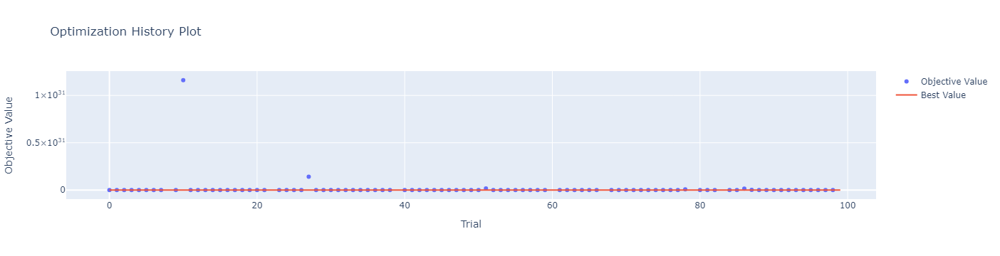

In [37]:
optuna.visualization.plot_optimization_history(study)

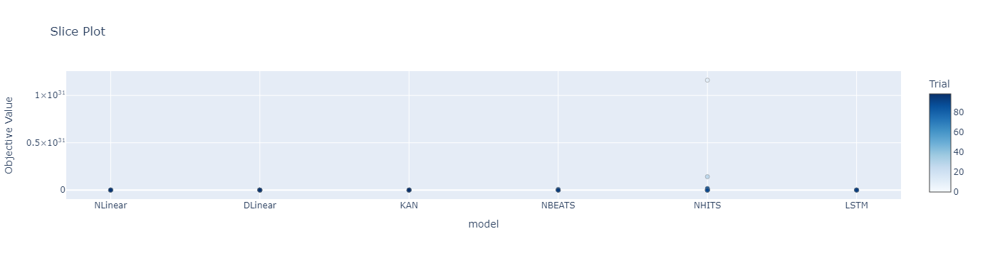

In [38]:
optuna.visualization.plot_slice(study, params=["model"])

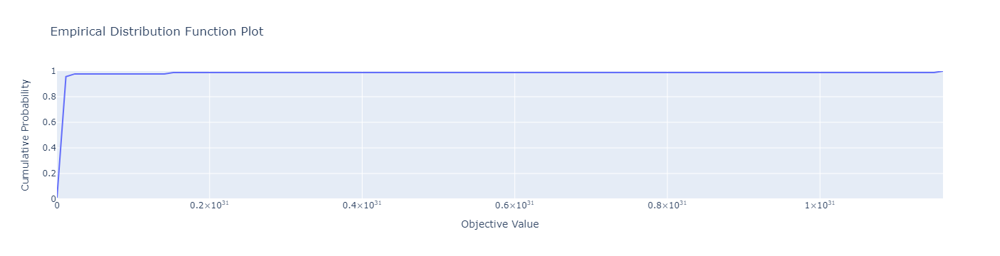

In [39]:
optuna.visualization.plot_edf(study)

## 5k точек

In [36]:
study = optuna.create_study(direction="minimize", sampler=optuna.samplers.RandomSampler(seed=1))

[I 2024-09-30 06:18:54,579] A new study created in memory with name: no-name-858f1921-6d96-414c-9720-d0e5d90c81e3


In [37]:
study.optimize(objective_5k, n_trials=100)

clear_output()

In [38]:
print("Best hyperparameters:", study.best_params)
print("Best RMSE:", study.best_value)

Best hyperparameters: {'model': 'KAN', 'input_size_kan': 302, 'max_steps_kan': 707, 'batch_size_kan': 100, 'learning_rate_kan': 0.1312054451733999}
Best RMSE: 0.23727093077461686


In [39]:
for trial in study.trials:
    print(trial.values, trial.params)

[0.5672547097941889] {'model': 'DLinear', 'input_size_dl': 174, 'max_steps_dl': 2382, 'batch_size_dl': 53, 'learning_rate_dl': 0.5392779172693536}
[5842.640745414663] {'model': 'NBEATS', 'input_size_nb': 267, 'max_steps_nb': 603, 'batch_size_nb': 21, 'learning_rate_nb': 0.1989033875957939}
[0.6728914199376641] {'model': 'DLinear', 'input_size_dl': 134, 'max_steps_dl': 1156, 'batch_size_dl': 25, 'learning_rate_dl': 0.8782643609259837}
[0.2457855360863718] {'model': 'KAN', 'input_size_kan': 375, 'max_steps_kan': 851, 'batch_size_kan': 6, 'learning_rate_kan': 0.7503941706300225}
[1.647374380047613] {'model': 'NLinear', 'input_size_nl': 464, 'max_steps_nl': 2174, 'batch_size_nl': 39, 'learning_rate_nl': 0.1308985435461594}
[1.1408471097188677] {'model': 'DLinear', 'input_size_dl': 330, 'max_steps_dl': 1587, 'batch_size_dl': 77, 'learning_rate_dl': 0.7000586016609103}
[0.2457855360863718] {'model': 'KAN', 'input_size_kan': 366, 'max_steps_kan': 563, 'batch_size_kan': 122, 'learning_rate_kan

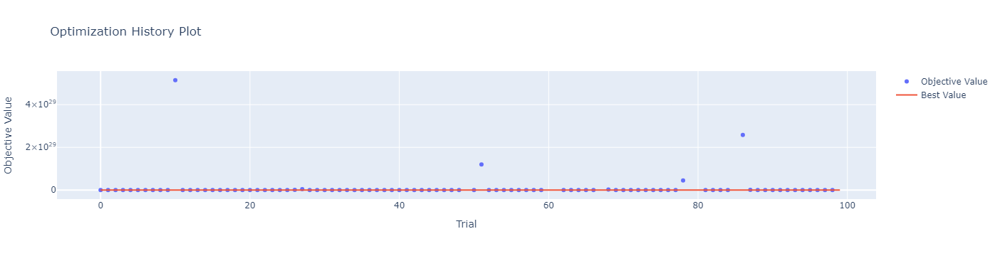

In [41]:
optuna.visualization.plot_optimization_history(study)

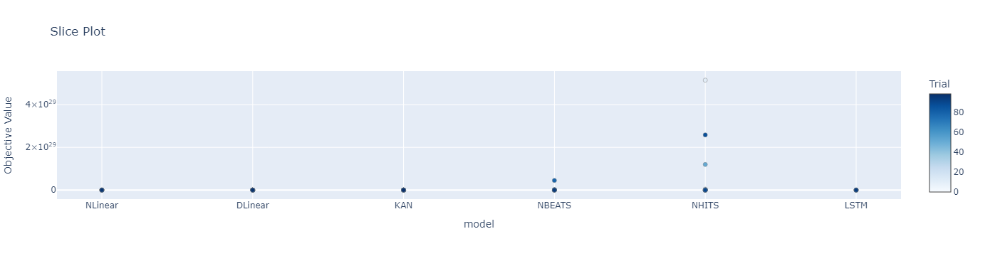

In [42]:
optuna.visualization.plot_slice(study, params=["model"])

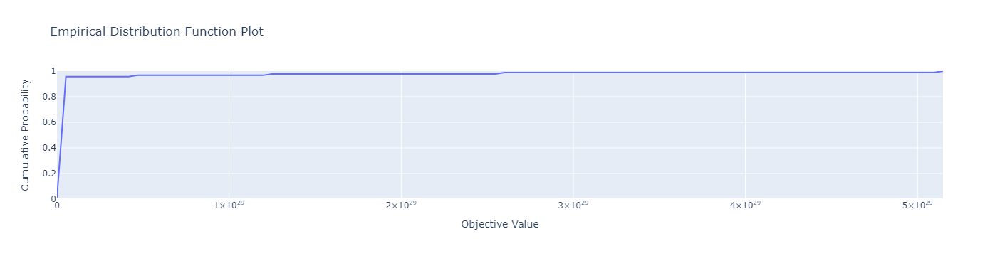

In [43]:
optuna.visualization.plot_edf(study)

## 1k точек

In [33]:
study = optuna.create_study(direction="minimize", sampler=optuna.samplers.RandomSampler(seed=1))

[I 2024-09-30 10:31:06,232] A new study created in memory with name: no-name-f6dc7b3a-b21b-4659-8f02-c2add1540033


In [ ]:
study.optimize(objective_1k, n_trials=100)

clear_output()

Seed set to 1


models: [DLinear]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 11     | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | linear_trend  | Linear        | 92.4 K | train
5 | linear_season | Linear        | 92.4 K | train
--------------------------------------------------------
184 K     Trainable params
11        Non-trainable params
184 K     Total params
0.739     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=2382` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(
2024/09/30 10:33:03 INFO mlflow.tracking._tracking_service.client: 🏃 View run DLinear_data_1k_2024-09-30 10:31:06.258488 at: http://mlflow:5000/#/experiments/3/runs/5093afa9df234c528c92694824fa3100.
2024/09/30 10:33:03 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://mlflow:5000/#/experiments/3.
[I 2024-09-30 10:33:03,515] Trial 0 finished with value: 0.6796031065617064 and parameters: {'model': 'DLinear', 'input_size_dl': 174, 'max_steps_dl': 2382, 'batch_size_dl': 53, 'learning_rate_dl': 0.5392779172693536}. Best is trial 0 with value: 0.6796031065617064.
Seed set to 1


models: [NBEATS]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 3.8 M  | train
-------------------------------------------------------
3.8 M     Trainable params
30.6 K    Non-trainable params
3.8 M     Total params
15.244    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [ ]:
print("Best hyperparameters:", study.best_params)
print("Best RMSE:", study.best_value)

In [ ]:
for trial in study.trials:
    print(trial.values, trial.params)

In [ ]:
sorted_trials = sorted(study.trials, key=lambda t: t.value, reverse=False)  # or reverse=False if minimizing
best_trials = sorted_trials[:20]  # Get the top 5 trials

# Print out the best 5 trials
for i, trial in enumerate(best_trials):
    print(f"Rank {i+1}: Value = {trial.value}, Params = {trial.params}")

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_slice(study, params=["model"])

In [ ]:
optuna.visualization.plot_edf(study)

# Визуализация работы лучших моделей

## KAN №1

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 4.2 M  | train
-------------------------------------------------------
4.2 M     Trainable params
11        Non-trainable params
4.2 M     Total params
16.998    Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=707` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


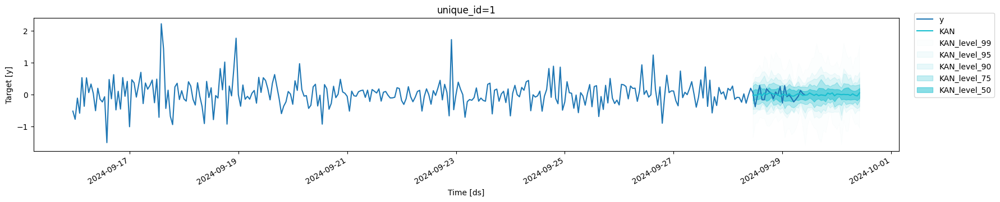

In [41]:
models = [KAN(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=302, max_steps=707, 
                  batch_size=100, learning_rate=0.1312054451733999)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## KAN №2

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 5.2 M  | train
-------------------------------------------------------
5.2 M     Trainable params
11        Non-trainable params
5.2 M     Total params
20.644    Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=662` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


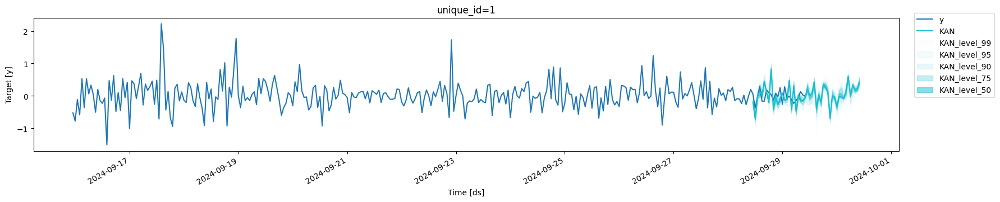

In [42]:
models = [KAN(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=480, max_steps=662, 
                  batch_size=108, learning_rate=0.008924943318328573)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## KAN №3

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 3.5 M  | train
-------------------------------------------------------
3.5 M     Trainable params
11        Non-trainable params
3.5 M     Total params
14.029    Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=439` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


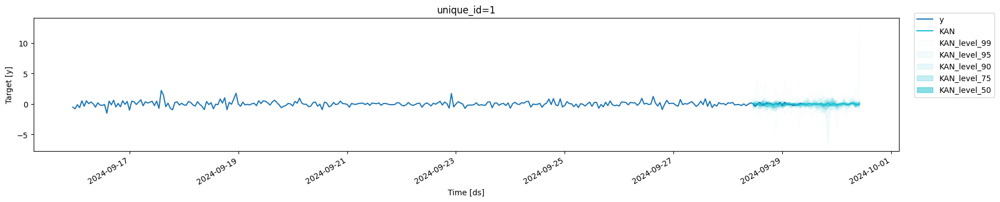

In [43]:
models = [KAN(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=157, max_steps=439, 
                  batch_size=7, learning_rate=0.1118094486652064)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## LSTM №1

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MQLoss        | 11     | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 484 K  | train
4 | context_adapter | Linear        | 96.5 K | train
5 | mlp_decoder     | MLP           | 4.4 K  | train
----------------------------------------------------------
584 K     Trainable params
11        Non-trainable params
584 K     Total params
2.340     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=500` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


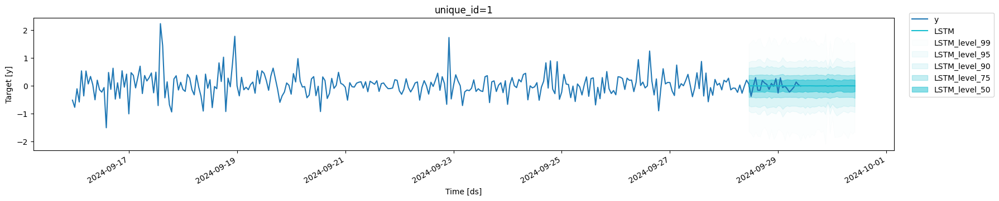

In [63]:
models = [LSTM(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=105, max_steps=500, 
                  batch_size=2, learning_rate=0.0490673043669288)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## NBEATS №1

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 4.3 M  | train
-------------------------------------------------------
4.3 M     Trainable params
53.1 K    Non-trainable params
4.3 M     Total params
17.236    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=452` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


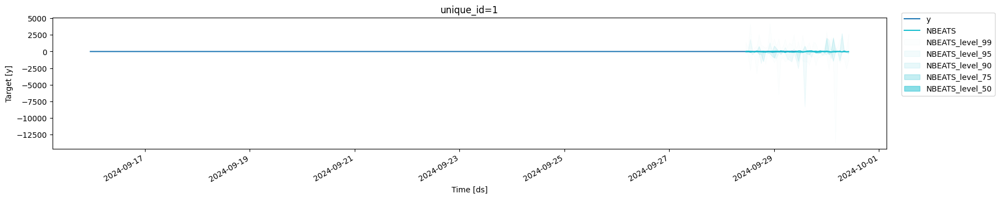

In [45]:
models = [NBEATS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=499, max_steps=452, 
                  batch_size=68, learning_rate=0.0320659783800923)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## NBEATS №2

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 4.2 M  | train
-------------------------------------------------------
4.2 M     Trainable params
49.7 K    Non-trainable params
4.2 M     Total params
16.935    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=461` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


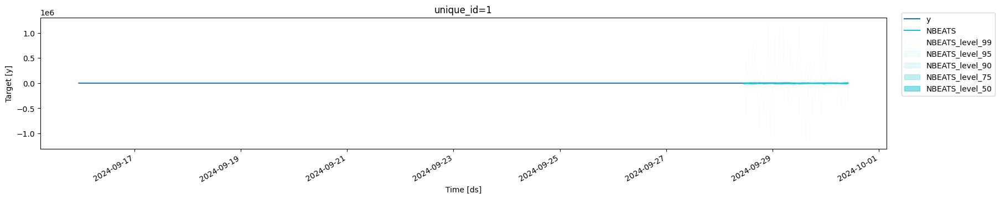

In [46]:
models = [NBEATS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=464, max_steps=461, 
                  batch_size=35, learning_rate=0.17425674061633573)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## NBEATS №3

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 4.2 M  | train
-------------------------------------------------------
4.2 M     Trainable params
48.8 K    Non-trainable params
4.2 M     Total params
16.858    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=575` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


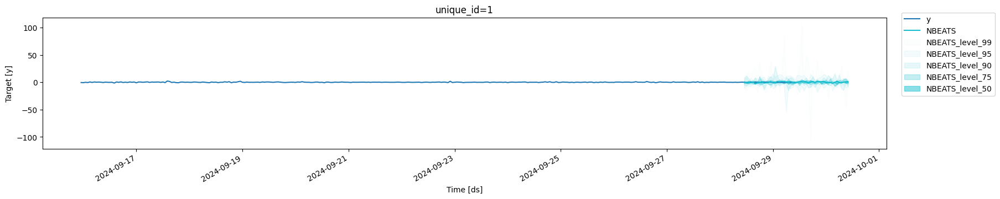

In [47]:
models = [NBEATS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=455, max_steps=575, 
                  batch_size=55, learning_rate=0.2696231301904332)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_1k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## NHITS №1

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 3.1 M  | train
-------------------------------------------------------
3.1 M     Trainable params
11        Non-trainable params
3.1 M     Total params
12.498    Total estimated model params size (MB)
34        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


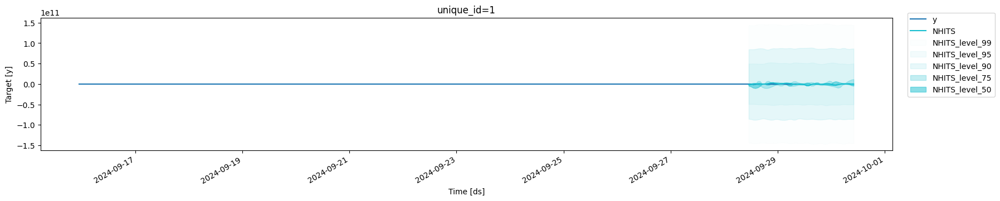

In [48]:
models = [NHITS(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=111, max_steps=100, 
                  batch_size=53, learning_rate=0.7471915571119176)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## NLinear №1

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | linear       | Linear        | 100 K  | train
-------------------------------------------------------
100 K     Trainable params
11        Non-trainable params
100 K     Total params
0.403     Total estimated model params size (MB)
4         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=3852` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


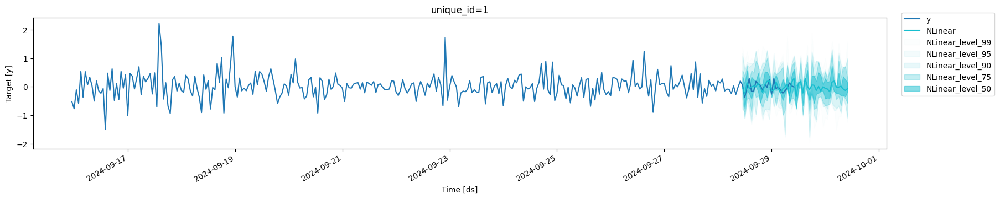

In [49]:
models = [NLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=190, max_steps=3852, 
                  batch_size=73, learning_rate=0.013543424178956737)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_1k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## NLinear №2

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | linear       | Linear        | 153 K  | train
-------------------------------------------------------
153 K     Trainable params
11        Non-trainable params
153 K     Total params
0.615     Total estimated model params size (MB)
4         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=2397` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


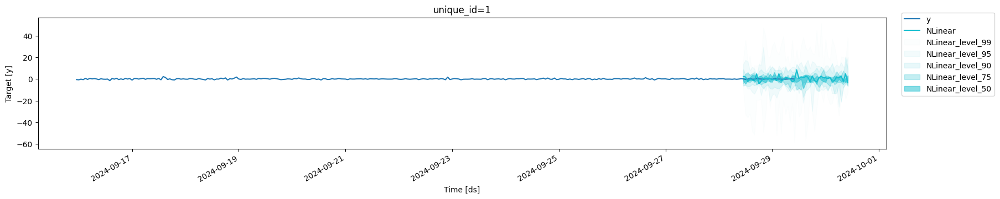

In [50]:
models = [NLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=290, max_steps=2397, 
                  batch_size=121, learning_rate=0.4900753961840234)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## NLinear №3

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MQLoss        | 11     | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | linear       | Linear        | 121 K  | train
-------------------------------------------------------
121 K     Trainable params
11        Non-trainable params
121 K     Total params
0.486     Total estimated model params size (MB)
4         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=1690` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


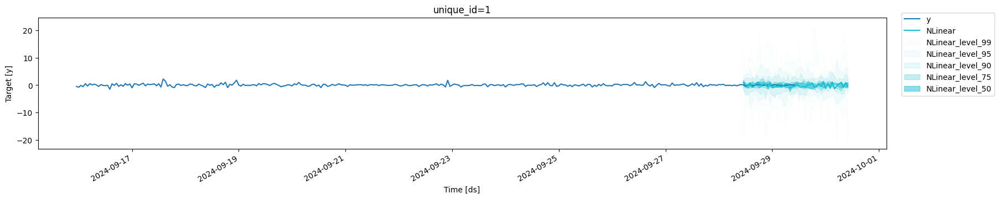

In [51]:
models = [NLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=229, max_steps=1690, 
                  batch_size=55, learning_rate=0.2421773292176332)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## DLinear №1

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 11     | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | linear_trend  | Linear        | 202 K  | train
5 | linear_season | Linear        | 202 K  | train
--------------------------------------------------------
404 K     Trainable params
11        Non-trainable params
404 K     Total params
1.618     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=3441` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


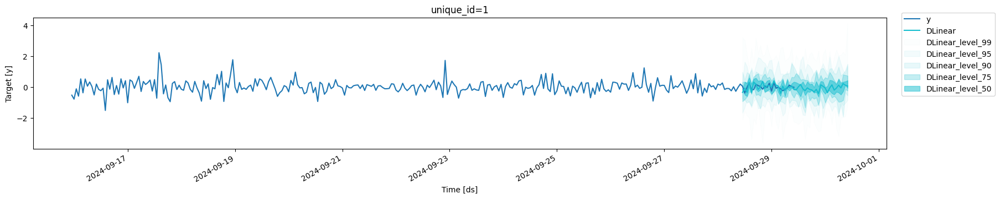

In [52]:
models = [DLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=382, max_steps=3441, 
                  batch_size=103, learning_rate=0.03553664865176262)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

## DLinear №2

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | loss          | MQLoss        | 11     | train
1 | padder_train  | ConstantPad1d | 0      | train
2 | scaler        | TemporalNorm  | 0      | train
3 | decomp        | SeriesDecomp  | 0      | train
4 | linear_trend  | Linear        | 96.6 K | train
5 | linear_season | Linear        | 96.6 K | train
--------------------------------------------------------
193 K     Trainable params
11        Non-trainable params
193 K     Total params
0.773     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=1304` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


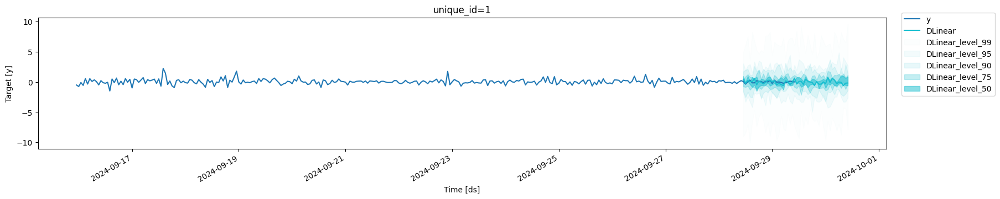

In [53]:
models = [DLinear(h=48, loss=MQLoss(level=[99, 95, 90, 75, 50]), random_seed=1,
                  input_size=182, max_steps=1304, 
                  batch_size=67, learning_rate=0.2622880022811541)]

nf = NeuralForecast(models=models, freq='h')
nf.fit(train_df_5k)

forecasts = nf.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns

plot_series(
    pd.concat([train_df_5k.iloc[-300:], test_df[:24]]), 
    forecasts_df=forecasts,
    engine='matplotlib',
    level=[99, 95, 90, 75, 50],
)

In [55]:
# Сохранение модели
with open("ml_models.dill", "wb") as file:
    dill.dump(nf, file)

In [56]:
with open("ml_models.dill", "rb") as file:
    model = dill.load(file)

In [60]:
forecasts = model.predict()
forecasts = forecasts.reset_index()
current_columns = forecasts.columns.tolist()
current_columns[2] = current_columns[2].split("-")[0]
forecasts.columns = current_columns
forecasts

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/site-packages/neuralforecast/core.py:209: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,unique_id,ds,DLinear,DLinear-lo-99,DLinear-lo-95,DLinear-lo-90,DLinear-lo-75,DLinear-lo-50,DLinear-hi-50,DLinear-hi-75,DLinear-hi-90,DLinear-hi-95,DLinear-hi-99
0,1,2024-09-28 11:00:00,0.422679,-9.005115,-1.722177,-1.619561,-0.768458,0.113128,0.927850,0.012176,1.723119,3.030063,4.930789
1,1,2024-09-28 12:00:00,-0.257649,-8.427721,-3.315199,-2.558913,-0.872915,-0.138539,-0.072347,0.890747,1.959956,1.850217,6.106543
2,1,2024-09-28 13:00:00,0.220196,-6.952846,-2.395966,-1.660459,-0.663938,0.061348,0.957017,1.235840,2.095723,2.699260,7.493793
3,1,2024-09-28 14:00:00,0.082477,-10.035629,-3.314189,-2.477772,-1.324091,-0.417696,0.097218,0.790420,1.157925,2.902132,3.600978
4,1,2024-09-28 15:00:00,0.017591,-6.571807,-4.208868,-2.585133,-0.907274,-0.857150,0.769310,0.783048,1.063492,1.503945,8.199007
5,1,2024-09-28 16:00:00,0.552587,-4.728920,-1.874491,-1.056917,-0.954315,-0.498625,0.510851,0.372843,2.600846,3.342182,6.782619
6,1,2024-09-28 17:00:00,-0.486743,-7.392051,-2.010332,-1.597024,-1.076883,-1.449872,0.834464,1.348633,1.738631,2.074083,5.266375
7,1,2024-09-28 18:00:00,0.153581,-5.798981,-1.804302,-1.015276,-0.889073,-0.776531,-0.177373,1.952937,2.021215,3.483868,4.620257
8,1,2024-09-28 19:00:00,-0.070376,-5.101094,-2.484026,-2.812137,-1.211342,-0.579062,0.475375,0.459524,1.352349,3.224949,5.230950
9,1,2024-09-28 20:00:00,-0.326343,-6.444393,-2.660070,-1.823493,-0.753836,-0.560949,0.387546,1.359179,2.116019,1.629154,4.888463
